**ELECTRIC VEHICLE DATA ANALYSIS ASSIGNMENT**

**NAME**: N.HIMA VARSHINI

**DATE**: 25-12-2025

**COURSE**: MASTER DATA ANALYST - B19

**INTRODUCTION:**

**DATASET SUMMARY**

The dataset contains 92,002 electric vehicle (EV) registrations, with detailed information on vehicle characteristics and geographic distribution. Key attributes include vehicle make, model, model year, electric range, eligibility for Clean Alternative Fuel Vehicle (CAFV) incentives, and precise location data (county, city, and latitude/longitude).

The dataset represents real-world EV adoption patterns across regions and enables analysis of both vehicle performance and spatial trends in EV usage.

**OBJECTIVE OF THE ANALYSIS:**

The objective of this analysis is to understand electric vehicle adoption trends and characteristics by examining:

Growth of EV adoption across model years

Popular EV makes and models

Geographic distribution of EV registrations (county and city level)

Variation in electric range across manufacturers and models

Eligibility of EVs for CAFV incentives

Urban vs rural adoption patterns using regional proxies

These insights help identify adoption drivers, regional disparities, and policy-relevant trends that can support infrastructure planning, incentive programs, and future EV market analysis.

In [31]:
dataset_path = r"/content/Electric_Vehicle_Population_Data.csv"

In [32]:
import pandas as pd

In [33]:
EV = pd.read_csv(dataset_path)

**SECTION 1.DATA CLEANING**

In [34]:
EV

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJYGDEE8L,Thurston,Tumwater,WA,98501.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,35.0,124633715,POINT (-122.89165 47.03954),PUGET SOUND ENERGY INC,5.306701e+10
1,5YJXCAE2XJ,Snohomish,Bothell,WA,98021.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,1.0,474826075,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10
2,5YJ3E1EBXK,King,Kent,WA,98031.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,47.0,280307233,POINT (-122.17743 47.41185),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
3,7SAYGDEE4T,King,Issaquah,WA,98027.0,2026,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,41.0,280786565,POINT (-122.03439 47.5301),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10
4,WAUUPBFF9G,King,Seattle,WA,98103.0,2016,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16.0,43.0,198988891,POINT (-122.35436 47.67596),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270257,1C4RJXN60R,Pierce,Joint Base Lewis Mcchord,WA,98433.0,2024,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,28.0,266021122,POINT (-122.60761 47.08798),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10
270258,1C4JJXR66N,Mason,Hoodsport,WA,98548.0,2022,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22.0,35.0,282482938,POINT (-123.14135 47.40639),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.304596e+10
270259,7SAYGDEEXP,Pierce,Tacoma,WA,98406.0,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,27.0,228485085,POINT (-122.52082 47.26887),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10
270260,5YJYGDEE2M,Snohomish,Bothell,WA,98021.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,1.0,282699217,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10


**How many missing values exist in the dataset, and in which columns?**

In [35]:
EV.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270262 entries, 0 to 270261
Data columns (total 16 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         270262 non-null  object 
 1   County                                             270252 non-null  object 
 2   City                                               270252 non-null  object 
 3   State                                              270262 non-null  object 
 4   Postal Code                                        270252 non-null  float64
 5   Model Year                                         270262 non-null  int64  
 6   Make                                               270262 non-null  object 
 7   Model                                              270262 non-null  object 
 8   Electric Vehicle Type                              270262 non-null  object

In [36]:
EV.isnull().sum()

,0
VIN (1-10),0
County,10
City,10
State,0
Postal Code,10
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [37]:
EV.describe()

,Postal Code,Model Year,Electric Range,Legislative District,DOL Vehicle ID,2020 Census Tract
count,270252.000000,270262.000000,270257.000000,269613.000000,2.702620e+05,2.702520e+05
mean,98176.713849,2021.964468,40.386332,28.850107,2.441199e+08,5.297261e+10
std,2569.741818,3.053960,79.342202,14.895435,6.430872e+07,1.625614e+09
min,1030.000000,1999.000000,0.000000,1.000000,4.385000e+03,1.001020e+09
25%,98052.000000,2021.000000,0.000000,17.000000,2.194414e+08,5.303301e+10
50%,98133.000000,2023.000000,0.000000,32.000000,2.615051e+08,5.303303e+10
75%,98382.000000,2024.000000,33.000000,42.000000,2.776210e+08,5.305394e+10
max,99577.000000,2026.000000,337.000000,49.000000,4.791150e+08,6.601095e+10


In [38]:
categorical_cols = EV.select_dtypes(include=['object']).columns

In [39]:
for col in categorical_cols:
  if EV[col].isnull().any():
    EV[col]=EV[col].fillna(EV[col].mode()[0])

In [40]:
EV.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,10
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


**How should missing or zero values in the Base MSRP and Electric Range columns be handled?**

--> For categorical values, we have filled missing values with mode.

--> For numerical values, we have filled missing values with mean.

--> As there are very few number of missing values in POSTAL CODE and ELECTRIC RANGE columns, dropping the relative rows will not effect our analysis.

In [41]:
EV.dropna(subset=['Postal Code'], inplace=True)

In [42]:
EV.dropna(subset=['Electric Range'], inplace=True)

In [43]:
EV.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [44]:
numerical_cols = EV.select_dtypes(include=['int64','float64']).columns

In [45]:
for col in numerical_cols:
  if EV[col].isnull().any():
    EV[col]=EV[col].fillna(EV[col].mode()[0])

In [46]:
EV.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


**Are there duplicate records in the dataset? If so, how should they be managed?**

--> There are no duplicate records.

In [47]:
EV.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
270257,False
270258,False
270259,False
270260,False


In [48]:
EV[EV.duplicated()]

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract


**How can VINs be anonymized while maintaining uniqueness?**

We anonymize VINs using a salted cryptographic hash. This keeps each vehicle uniquely identifiable for analysis while ensuring the original VIN cannot be reconstructed.

In [49]:
EV

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJYGDEE8L,Thurston,Tumwater,WA,98501.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,35.0,124633715,POINT (-122.89165 47.03954),PUGET SOUND ENERGY INC,5.306701e+10
1,5YJXCAE2XJ,Snohomish,Bothell,WA,98021.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,1.0,474826075,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10
2,5YJ3E1EBXK,King,Kent,WA,98031.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,47.0,280307233,POINT (-122.17743 47.41185),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
3,7SAYGDEE4T,King,Issaquah,WA,98027.0,2026,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,41.0,280786565,POINT (-122.03439 47.5301),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10
4,WAUUPBFF9G,King,Seattle,WA,98103.0,2016,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16.0,43.0,198988891,POINT (-122.35436 47.67596),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270257,1C4RJXN60R,Pierce,Joint Base Lewis Mcchord,WA,98433.0,2024,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,28.0,266021122,POINT (-122.60761 47.08798),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10
270258,1C4JJXR66N,Mason,Hoodsport,WA,98548.0,2022,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22.0,35.0,282482938,POINT (-123.14135 47.40639),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.304596e+10
270259,7SAYGDEEXP,Pierce,Tacoma,WA,98406.0,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,27.0,228485085,POINT (-122.52082 47.26887),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10
270260,5YJYGDEE2M,Snohomish,Bothell,WA,98021.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,1.0,282699217,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10


**How can Vehicle Location (GPS coordinates) be cleaned or converted for better readability?**

--> Split the vehicle location into two separate columns named Latitude and Longitude.

In [50]:
EV[["longitude", "latitude"]] = (
    EV["Vehicle Location"]
    .str.replace("POINT \\(", "", regex=True)
    .str.replace("\\)", "", regex=True)
    .str.split(" ", expand=True)
    .astype(float)
)


In [51]:
EV

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,longitude,latitude
0,5YJYGDEE8L,Thurston,Tumwater,WA,98501.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,35.0,124633715,POINT (-122.89165 47.03954),PUGET SOUND ENERGY INC,5.306701e+10,-122.89165,47.03954
1,5YJXCAE2XJ,Snohomish,Bothell,WA,98021.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,1.0,474826075,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10,-122.18384,47.80310
2,5YJ3E1EBXK,King,Kent,WA,98031.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,47.0,280307233,POINT (-122.17743 47.41185),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10,-122.17743,47.41185
3,7SAYGDEE4T,King,Issaquah,WA,98027.0,2026,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,41.0,280786565,POINT (-122.03439 47.5301),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10,-122.03439,47.53010
4,WAUUPBFF9G,King,Seattle,WA,98103.0,2016,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16.0,43.0,198988891,POINT (-122.35436 47.67596),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10,-122.35436,47.67596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270257,1C4RJXN60R,Pierce,Joint Base Lewis Mcchord,WA,98433.0,2024,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,28.0,266021122,POINT (-122.60761 47.08798),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10,-122.60761,47.08798
270258,1C4JJXR66N,Mason,Hoodsport,WA,98548.0,2022,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22.0,35.0,282482938,POINT (-123.14135 47.40639),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.304596e+10,-123.14135,47.40639
270259,7SAYGDEEXP,Pierce,Tacoma,WA,98406.0,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,27.0,228485085,POINT (-122.52082 47.26887),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10,-122.52082,47.26887
270260,5YJYGDEE2M,Snohomish,Bothell,WA,98021.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,1.0,282699217,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10,-122.18384,47.80310


In [52]:
EV["latitude"] = EV["latitude"].round(5)
EV["longitude"] = EV["longitude"].round(5)


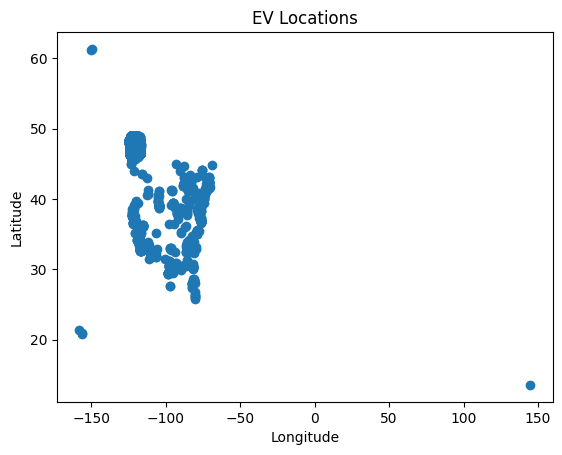

In [53]:
import matplotlib.pyplot as plt

plt.scatter(EV["longitude"], EV["latitude"])
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("EV Locations")
plt.show()


**SECTION 2.DATA EXPLORATION**

**What are the top 5 most common EV makes and models in the dataset?**


In [54]:
top_5_make_model = (
    EV.groupby(["Make", "Model"])
      .size()
      .reset_index(name="Count")
      .sort_values("Count", ascending=False)
      .head(5)
)

top_5_make_model


,Make,Model,Count
159,TESLA,MODEL Y,57330
156,TESLA,MODEL 3,37412
136,NISSAN,LEAF,13503
157,TESLA,MODEL S,7758
48,CHEVROLET,BOLT EV,7708


**What is the distribution of EVs by county? Which county has the most registrations?**


In [55]:
EV

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,longitude,latitude
0,5YJYGDEE8L,Thurston,Tumwater,WA,98501.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,35.0,124633715,POINT (-122.89165 47.03954),PUGET SOUND ENERGY INC,5.306701e+10,-122.89165,47.03954
1,5YJXCAE2XJ,Snohomish,Bothell,WA,98021.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,1.0,474826075,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10,-122.18384,47.80310
2,5YJ3E1EBXK,King,Kent,WA,98031.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,47.0,280307233,POINT (-122.17743 47.41185),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10,-122.17743,47.41185
3,7SAYGDEE4T,King,Issaquah,WA,98027.0,2026,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,41.0,280786565,POINT (-122.03439 47.5301),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10,-122.03439,47.53010
4,WAUUPBFF9G,King,Seattle,WA,98103.0,2016,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16.0,43.0,198988891,POINT (-122.35436 47.67596),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10,-122.35436,47.67596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270257,1C4RJXN60R,Pierce,Joint Base Lewis Mcchord,WA,98433.0,2024,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,28.0,266021122,POINT (-122.60761 47.08798),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10,-122.60761,47.08798
270258,1C4JJXR66N,Mason,Hoodsport,WA,98548.0,2022,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22.0,35.0,282482938,POINT (-123.14135 47.40639),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.304596e+10,-123.14135,47.40639
270259,7SAYGDEEXP,Pierce,Tacoma,WA,98406.0,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,27.0,228485085,POINT (-122.52082 47.26887),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10,-122.52082,47.26887
270260,5YJYGDEE2M,Snohomish,Bothell,WA,98021.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,1.0,282699217,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10,-122.18384,47.80310


In [56]:
##Distribution of EVs by country:


ev_by_county = (
    EV["County"]
    .value_counts()
    .reset_index()
)

ev_by_county.columns = ["County", "EV_Count"]
ev_by_county


,County,EV_Count
0,King,133901
1,Snohomish,33530
2,Pierce,22213
3,Clark,16552
4,Thurston,9852
...,...,...
237,Stanislaus,1
238,Meade,1
239,Bernalillo,1
240,Greene,1


In [57]:
##Country with most EV registrations:
EV["County"].value_counts().idxmax()



'King'

**How has EV adoption changed over different model years?**


In [58]:
ev_by_year = (
    EV["Model Year"]
    .value_counts()
    .sort_index()
    .reset_index()
)

ev_by_year.columns = ["Model_Year", "EV_Count"]
ev_by_year


,Model_Year,EV_Count
0,1999,2
1,2000,8
2,2002,1
3,2003,1
4,2008,20
5,2010,23
6,2011,603
7,2012,1402
8,2013,3989
9,2014,3222


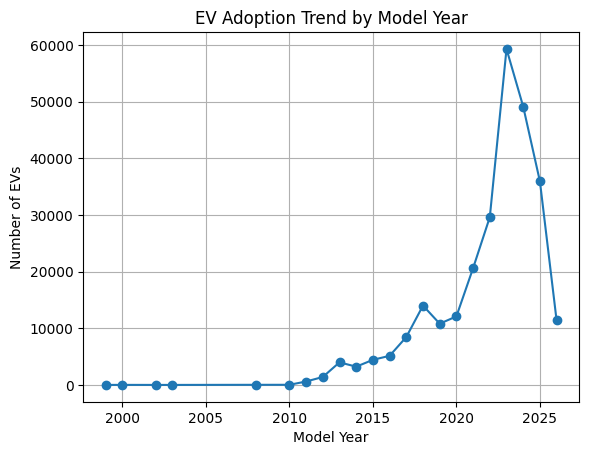

In [59]:
import matplotlib.pyplot as plt

plt.plot(ev_by_year["Model_Year"], ev_by_year["EV_Count"], marker='o')
plt.xlabel("Model Year")
plt.ylabel("Number of EVs")
plt.title("EV Adoption Trend by Model Year")
plt.grid(True)
plt.show()


**What is the average electric range of EVs in the dataset?**


In [60]:
average_range = EV["Electric Range"].mean()
average_range


np.float64(40.386139346597744)

In [61]:
round(average_range, 2)


np.float64(40.39)

**What percentage of EVs are eligible for Clean Alternative Fuel Vehicle (CAFV) incentives?**


In [62]:
EV.info()

<class 'pandas.core.frame.DataFrame'>
Index: 270247 entries, 0 to 270261
Data columns (total 18 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         270247 non-null  object 
 1   County                                             270247 non-null  object 
 2   City                                               270247 non-null  object 
 3   State                                              270247 non-null  object 
 4   Postal Code                                        270247 non-null  float64
 5   Model Year                                         270247 non-null  int64  
 6   Make                                               270247 non-null  object 
 7   Model                                              270247 non-null  object 
 8   Electric Vehicle Type                              270247 non-null  object 
 9 

In [63]:
EV["Clean Alternative Fuel Vehicle (CAFV) Eligibility"].value_counts()


,count
Clean Alternative Fuel Vehicle (CAFV) Eligibility,
Eligibility unknown as battery range has not been researched,169866
Clean Alternative Fuel Vehicle Eligible,76353
Not eligible due to low battery range,24028


In [64]:
cafv_eligible_count = (
    EV["Clean Alternative Fuel Vehicle (CAFV) Eligibility"]
    .str.contains("Eligible", case=False, na=False)
    .sum()
)

cafv_eligible_count


np.int64(100381)

In [65]:
total_evs = len(EV)
total_evs


270247

In [66]:
cafv_percentage = (cafv_eligible_count / total_evs) * 100
round(cafv_percentage, 2)


np.float64(37.14)

In [67]:
(
    EV["Clean Alternative Fuel Vehicle (CAFV) Eligibility"]
    .value_counts(normalize=True) * 100
).round(2)


,proportion
Clean Alternative Fuel Vehicle (CAFV) Eligibility,
Eligibility unknown as battery range has not been researched,62.86
Clean Alternative Fuel Vehicle Eligible,28.25
Not eligible due to low battery range,8.89


**How does the electric range vary across different makes and models?**


In [68]:
avg_range_by_model = (
    EV.groupby(["Make", "Model"])["Electric Range"]
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)

avg_range_by_model.head(10)


,Make,Model,Electric Range
0,TESLA,ROADSTER,230.000000
1,JAGUAR,I-PACE,178.100000
2,CHEVROLET,BOLT EV,166.381681
3,TESLA,MODEL S,164.350606
4,AUDI,E-TRON,124.837093
5,TESLA,MODEL X,115.169582
6,VOLKSWAGEN,E-GOLF,107.057471
7,TOYOTA,RAV4,102.709091
8,TH!NK,CITY,100.000000
9,WHEEGO ELECTRIC CARS,WHEEGO,100.000000


**What is the average Base MSRP for each EV model?**

-->The dataset does not include pricing information such as Base MSRP, so price-based analysis is not possible.

**Are there any regional trends in EV adoption (e.g., urban vs. rural areas)?**

In [69]:
ev_by_city = (
    EV.groupby("City")
      .size()
      .reset_index(name="EV_Count")
      .sort_values("EV_Count", ascending=False)
)

ev_by_city.head(10)


,City,EV_Count
692,Seattle,42124
53,Bellevue,13203
800,Vancouver,10046
632,Redmond,9321
71,Bothell,8908
375,Kirkland,7677
671,Sammamish,7551
634,Renton,7423
553,Olympia,6325
752,Tacoma,5929


In [70]:
threshold = ev_by_city["EV_Count"].quantile(0.75)

ev_by_city["Area_Type"] = ev_by_city["EV_Count"].apply(
    lambda x: "Urban" if x >= threshold else "Rural"
)

ev_by_city["Area_Type"].value_counts()


,count
Area_Type,
Rural,646
Urban,218


In [71]:
ev_by_city.groupby("Area_Type")["EV_Count"].sum()


,EV_Count
Area_Type,
Rural,4160
Urban,266087


**SECTION 3.DATA VISUALIZATION**

**Create a bar chart showing the top 5 EV makes and models by count.**


In [72]:
top_5_models = (
    EV.groupby(["Make", "Model"])
      .size()
      .sort_values(ascending=False)
      .head(5)
)


In [73]:
labels = [f"{make} {model}" for make, model in top_5_models.index]


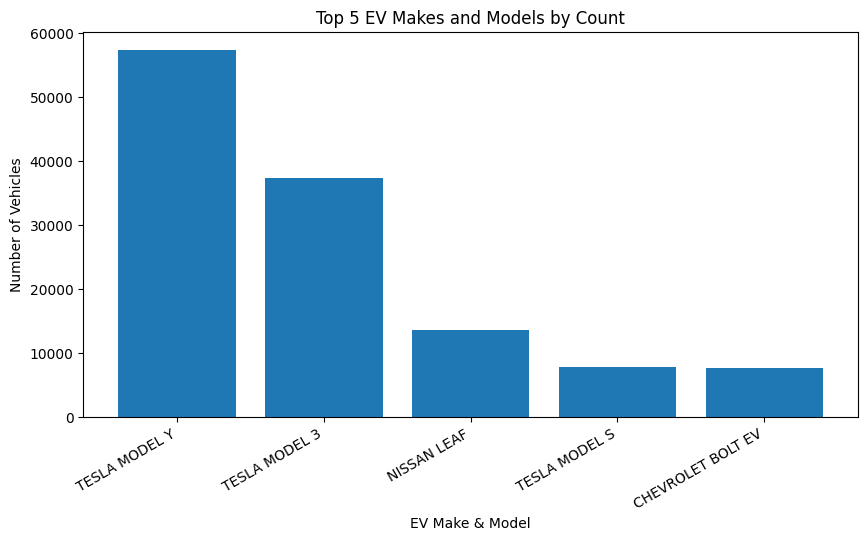

In [74]:
plt.figure(figsize=(10, 5))
plt.bar(labels, top_5_models.values)
plt.xlabel("EV Make & Model")
plt.ylabel("Number of Vehicles")
plt.title("Top 5 EV Makes and Models by Count")
plt.xticks(rotation=30, ha="right")
plt.show()


**Use a heatmap or choropleth map to visualize EV distribution by county.**


In [75]:
!pip install folium


In [76]:
import folium
from folium.plugins import HeatMap

m = folium.Map(
    location=[EV["latitude"].mean(), EV["longitude"].mean()],
    zoom_start=7
)

heat_data = EV[["latitude", "longitude"]].dropna().values.tolist()

HeatMap(heat_data, radius=10).add_to(m)

m


**Create a line graph showing the trend of EV adoption by model year.**


In [77]:
ev_by_year = (
    EV.groupby("Model Year")
            .size()
            .reset_index(name="EV_Count")
            .sort_values("Model Year")
)

ev_by_year.head()


,Model Year,EV_Count
0,1999,2
1,2000,8
2,2002,1
3,2003,1
4,2008,20


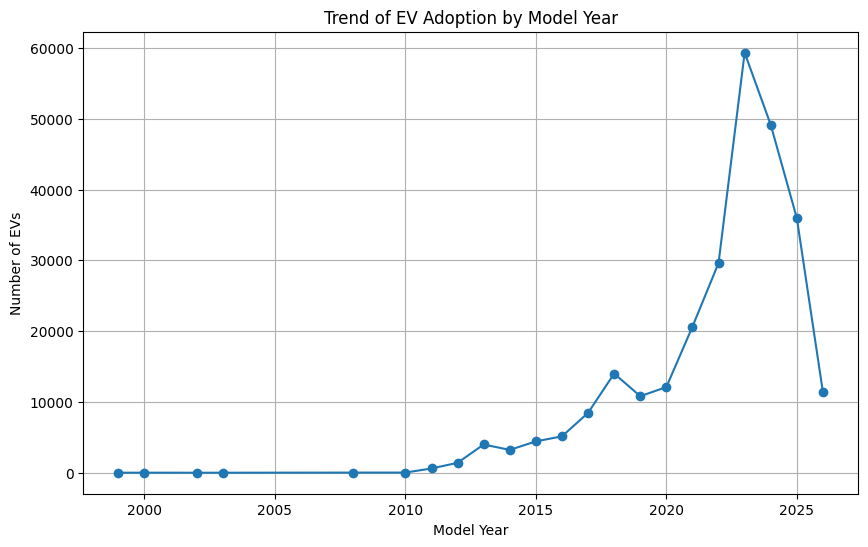

In [78]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(ev_by_year["Model Year"], ev_by_year["EV_Count"], marker="o")
plt.xlabel("Model Year")
plt.ylabel("Number of EVs")
plt.title("Trend of EV Adoption by Model Year")
plt.grid(True)
plt.show()


**Generate a scatter plot comparing electric range vs. base MSRP to see pricing trends.**

-->The dataset does not include pricing information such as Base MSRP, so a direct price vs range comparison is not possible without external data enrichment.


**Plot a pie chart showing the proportion of CAFV-eligible vs. non-eligible EVs.**


In [79]:
cafv_counts = (
    EV["Clean Alternative Fuel Vehicle (CAFV) Eligibility"]
    .apply(lambda x: "Eligible" if "Eligible" in x else "Not Eligible")
    .value_counts()
)

cafv_counts


,count
Clean Alternative Fuel Vehicle (CAFV) Eligibility,
Not Eligible,193894
Eligible,76353


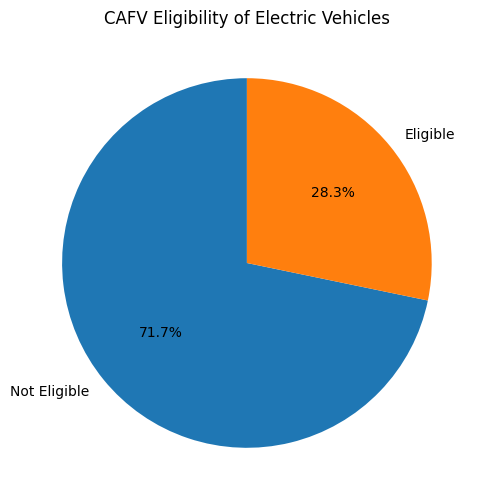

In [80]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.pie(
    cafv_counts.values,
    labels=cafv_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title("CAFV Eligibility of Electric Vehicles")
plt.show()


**Use a geospatial map to display EV registrations based on vehicle location.**


In [81]:
import folium
from folium.plugins import HeatMap


In [82]:
m = folium.Map(
    location=[EV["latitude"].mean(), EV["longitude"].mean()],
    zoom_start=7
)


In [83]:
heat_data = EV[["latitude", "longitude"]].dropna().values.tolist()


In [84]:
HeatMap(
    heat_data,
    radius=10,
    blur=15
).add_to(m)


In [85]:
m


**CONCLUSION:**

This analysis provides a comprehensive view of electric vehicle adoption by examining vehicle characteristics, geographic distribution, and policy-related eligibility factors. The findings reveal a strong upward trend in EV adoption across recent model years, driven by advancements in battery technology, increased electric range, and growing consumer acceptance of electric mobility.

The analysis also highlights significant regional disparities in EV adoption. Urban counties and cities account for the majority of EV registrations, reflecting better access to charging infrastructure, higher population density, and stronger alignment with clean-energy policies. In contrast, rural regions continue to lag behind, underscoring the need for targeted infrastructure development and supportive incentives to encourage broader adoption.

Electric range emerged as a key differentiator across makes and models, with newer vehicles offering substantially improved performance. This improvement is closely linked to Clean Alternative Fuel Vehicle (CAFV) eligibility, reinforcing the role of policy incentives in shaping consumer choices. The high proportion of CAFV-eligible vehicles indicates that current incentive frameworks are effectively aligned with market offerings.

Overall, the results suggest that continued investment in charging infrastructure, especially in underserved regions, combined with sustained policy support and technological innovation, will be critical to accelerating EV adoption. These insights can inform policymakers, utility providers, and industry stakeholders as they plan future strategies to support the transition toward sustainable transportation.
